In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [12]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline

In [16]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

In [2]:
df = pd.read_csv("./bank-customer-churn-prediction.csv")
df.head(100)

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...
95,15699461,515,Spain,Male,35,10,176273.95,1,0,1,121277.78,0
96,15738721,773,Spain,Male,41,9,102827.44,1,0,1,64595.25,0
97,15693683,814,Germany,Male,29,8,97086.40,2,1,1,197276.13,0
98,15604348,710,Spain,Male,22,8,0.00,2,0,0,99645.04,0


In [3]:
df.describe()

,customer_id,credit_score,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [4]:
# encode country and gender
df['gender_encoded'] = LabelEncoder().fit_transform(df['gender'])
df['country_encoded'] = LabelEncoder().fit_transform(df['country'])

<Axes: >

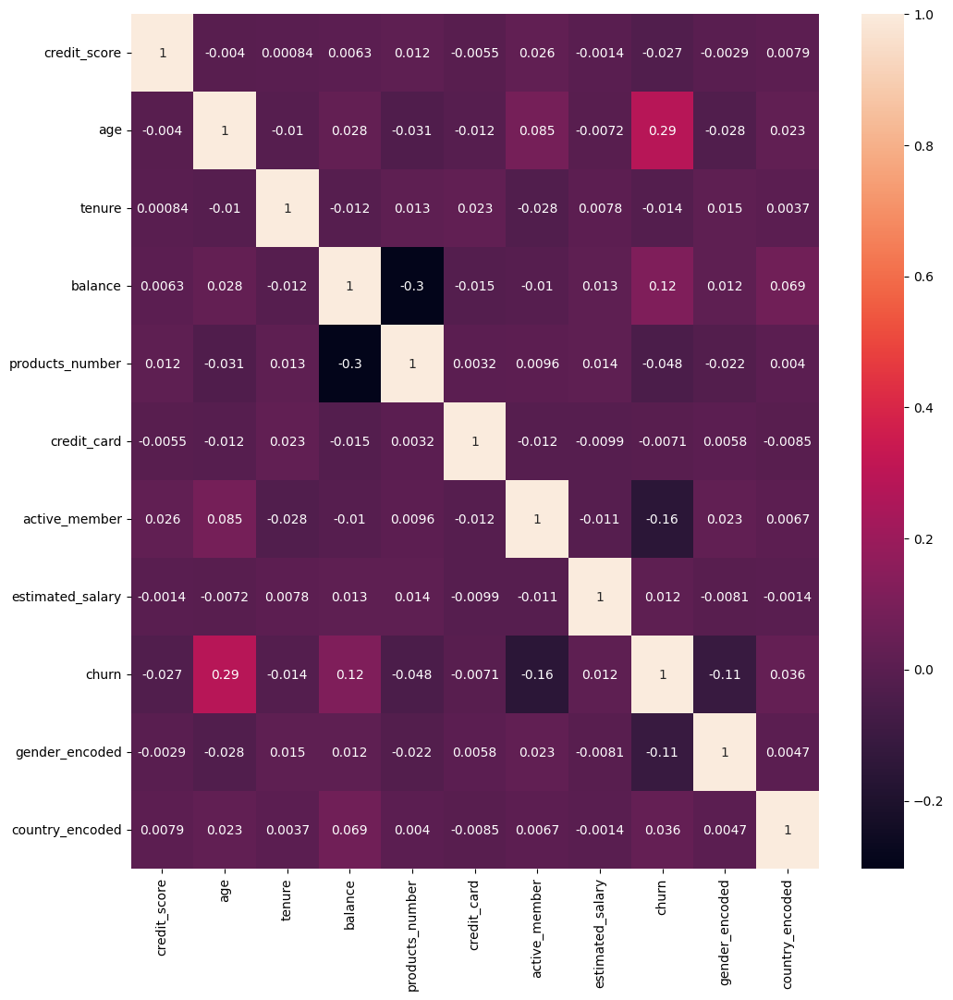

In [5]:
corr_data = df.drop(columns=['customer_id', 'gender', 'country'], axis=1)
plt.figure(figsize=(12, 12))
sns.heatmap(data=corr_data.corr(), annot=True)

In [6]:
# draw histos of columns with high corr number - active_member, age, balance, gender_encoded
fig = px.histogram(df, x='active_member', color="churn",
                  marginal="box", hover_data=df.columns)
fig.show()

In [7]:
fig = px.histogram(df, x='age', color="churn",
                  marginal="box", hover_data=df.columns)
fig.show()

In [8]:
fig = px.histogram(df, x='balance', color="churn",
                  marginal="box", hover_data=df.columns)
fig.show()

In [9]:
fig = px.histogram(df, x='gender_encoded', color="churn",
                  marginal="box", hover_data=df.columns)
fig.show()

In [10]:
#preprocess
# drop id and unencoded gender and country
df = df.drop(columns=['gender', 'customer_id', 'country'], axis=1)
df.columns

Index(['credit_score', 'age', 'tenure', 'balance', 'products_number',
       'credit_card', 'active_member', 'estimated_salary', 'churn',
       'gender_encoded', 'country_encoded'],
      dtype='object')

In [13]:
# create pipeline
categorical_feature_indices = ['credit_card', 'active_member','gender_encoded', 'country_encoded']
scaler_feature_indices = ['credit_score', 'age', 'tenure', 'balance', 'products_number','estimated_salary']
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(), categorical_feature_indices),
        ('scaler', StandardScaler(), scaler_feature_indices)
    ],
    remainder='passthrough'
)

In [14]:
# split train and test set
X_labels = ['credit_score', 'age', 'tenure', 'balance', 'products_number',
       'credit_card', 'active_member', 'estimated_salary',
       'gender_encoded', 'country_encoded']
y_labels = ['churn']
X = df[X_labels]
y = df[y_labels]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=60)

In [17]:
#decision tree
decision_tree = DecisionTreeClassifier(random_state=60, class_weight='balanced')
decision_tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('decision_tree', decision_tree)])
decision_tree_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot', OneHotEncoder(),
                                                  ['credit_card',
                                                   'active_member',
                                                   'gender_encoded',
                                                   'country_encoded']),
                                                 ('scaler', StandardScaler(),
                                                  ['credit_score', 'age',
                                                   'tenure', 'balance',
                                                   'products_number',
                                                   'estimated_salary'])])),
                ('decision_tree',
                 DecisionTreeClassifier(class_weight='balanced',
                                        random_state=60))])

In [18]:
# evaluate decision tree
y_pred = decision_tree_pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1: {f1}")

Accuracy: 0.793
Precision: 0.5035460992907801
Recall: 0.5107913669064749
F1: 0.5071428571428572


In [19]:
len(y_pred[y_pred==1])

423

In [20]:
# svm
svm = SVC(kernel='rbf', class_weight='balanced', verbose=1)
svm_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('svm', svm)])
svm_pipeline.fit(X_train, y_train)

/home/sparsh/anaconda3/envs/mathml/lib/python3.12/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[LibSVM]......*..*
optimization finished, #iter = 8169
obj = -3744.843454, rho = 0.539370
nSV = 4240, nBSV = 3119
Total nSV = 4240


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot', OneHotEncoder(),
                                                  ['credit_card',
                                                   'active_member',
                                                   'gender_encoded',
                                                   'country_encoded']),
                                                 ('scaler', StandardScaler(),
                                                  ['credit_score', 'age',
                                                   'tenure', 'balance',
                                                   'products_number',
                                                   'estimated_salary'])])),
                ('svm', SVC(class_weight='balanced', verbose=1))])

In [21]:
# evaluate svm
y_pred = svm_pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"Recall: {f1}")

Accuracy: 0.7895
Precision: 0.49691358024691357
Recall: 0.7721822541966427
Recall: 0.6046948356807512


In [22]:
# Logistic Regression
lr = LogisticRegression(verbose=1, class_weight='balanced')
lr_pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('lr', lr)])
lr_pipeline.fit(X_train, y_train)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           16     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.54518D+03    |proj g|=  1.39530D+03

           * * *


/home/sparsh/anaconda3/envs/mathml/lib/python3.12/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

 This problem is unconstrained.


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot', OneHotEncoder(),
                                                  ['credit_card',
                                                   'active_member',
                                                   'gender_encoded',
                                                   'country_encoded']),
                                                 ('scaler', StandardScaler(),
                                                  ['credit_score', 'age',
                                                   'tenure', 'balance',
                                                   'products_number',
                                                   'estimated_salary'])])),
                ('lr', LogisticRegression(class_weight='balanced', verbose=1))])


Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   16     14     16      1     0     0   3.871D-02   4.655D+03
  F =   4654.8699437073719     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


In [23]:
# evaluate LR
y_pred = lr_pipeline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1: {f1}")

Accuracy: 0.7225
Precision: 0.40599455040871935
Recall: 0.7146282973621103
F1: 0.5178105994787142


In [24]:
# neural network
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [26]:
# define NN
class MyNN(nn.Module):
    def __init__(self, input_size):
        super(MyNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 16)
        self.fc2 = nn.Linear(16, 48)
        self.fc3 = nn.Linear(48, 24)
        self.fc4 = nn.Linear(24, 12)
        self.fc5 = nn.Linear(12, 1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        
        
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.relu(self.fc4(x))
        x = self.sigmoid(self.fc5(x))
        return x

In [27]:
# scale data and one-hot encode
X[scaler_feature_indices] = StandardScaler().fit_transform(X[scaler_feature_indices])
encoder = OneHotEncoder(sparse_output=False)
encoded_features = encoder.fit_transform(X[categorical_feature_indices])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_feature_indices))
X_encoded = pd.concat([X.drop(columns=categorical_feature_indices), encoded_df], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=60)

train_data = TensorDataset(torch.tensor(X_train.values).float().to(device), torch.tensor(y_train.values).float().to(device))
test_data = TensorDataset(torch.tensor(X_test.values).float().to(device), torch.tensor(y_test.values).float().to(device))

/tmp/ipykernel_6587/2522966519.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [28]:
# dataloader
batch_size = 1024
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size)

In [35]:
# train model
input_size = len(X_encoded.columns)
model = MyNN(input_size).to(device)
loss_fn = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

epochs = 250
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        output = model(batch_X)
        loss = loss_fn(output.squeeze().view(-1, 1), batch_y.view(-1, 1))
        running_loss += loss.item()
        loss.backward()
        optimizer.step()
    if epoch % 20 == 0:
        print(f"epoch:{epoch}, loss:{running_loss}")

epoch:0, loss:5.286346614360809
epoch:20, loss:3.4549544751644135
epoch:40, loss:2.729901909828186
epoch:60, loss:2.6493672132492065
epoch:80, loss:2.6175608336925507
epoch:100, loss:2.594294309616089
epoch:120, loss:2.5654999017715454
epoch:140, loss:2.5560388565063477
epoch:160, loss:2.531814932823181
epoch:180, loss:2.517006814479828
epoch:200, loss:2.507546693086624
epoch:220, loss:2.4952755868434906
epoch:240, loss:2.477547377347946


In [36]:
# evaluate nn
model.eval()

tp = 0
fp = 0
tn = 0
fn = 0

with torch.no_grad():
    output = model(torch.tensor(X_test.values).float().to(device))
    y_pred = (output.squeeze() > 0.5).float()

    
accuracy = accuracy_score(y_test, y_pred.detach().cpu().numpy())
precision = precision_score(y_test, y_pred.detach().cpu().numpy())
recall = recall_score(y_test, y_pred.detach().cpu().numpy())
f1 = f1_score(y_test, y_pred.detach().cpu().numpy())


print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1: {f1}")

Accuracy: 0.861
Precision: 0.7112462006079028
Recall: 0.5611510791366906
F1: 0.6273458445040213
